# HiResIreland

In [1]:
# import libraries
import glob
import itertools
import os
from datetime import datetime, timezone
import geopandas as gpd
import matplotlib.pyplot as plt
import xarray as xr
import climag.plot_configs as cplt

In [2]:
print("Last updated:", datetime.now(tz=timezone.utc))

Last updated: 2022-10-19 14:47:41.160958+00:00


In [3]:
DATA_DIR_BASE = os.path.join("data", "HiResIreland")

In [4]:
# Cork Airport met station coords
LON = -8.48611
LAT = 51.84722

In [5]:
# Ireland boundary
GPKG_BOUNDARY = os.path.join("data", "boundary", "boundaries.gpkg")
ie = gpd.read_file(GPKG_BOUNDARY, layer="NUTS_Ireland_ITM")

## rcp85

In [6]:
data = xr.open_mfdataset(
    list(itertools.chain(*list(
        glob.glob(os.path.join(DATA_DIR_BASE, "rcp85", "MPI-ESM-LR", e))
        for e in ["*mean_T_2M*.nc", "*ASOB_S*.nc", "*ET*.nc", "*TOT_PREC*.nc"]
    ))),
    chunks="auto",
    decode_coords="all"
)

In [7]:
data

<xarray.Dataset>
Dimensions:       (time: 10957, bnds: 2, rlat: 145, rlon: 112)
Coordinates:
  * time          (time) datetime64[ns] 2041-01-01T10:30:00 ... 2070-12-31T10...
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(10957, 2), meta=np.ndarray>
    lon           (rlat, rlon) float32 dask.array<chunksize=(145, 112), meta=np.ndarray>
    lat           (rlat, rlon) float32 dask.array<chunksize=(145, 112), meta=np.ndarray>
  * rlon          (rlon) float64 -2.065 -2.03 -1.995 -1.96 ... 1.75 1.785 1.82
  * rlat          (rlat) float64 -2.4 -2.365 -2.33 -2.295 ... 2.57 2.605 2.64
    rotated_pole  int32 1
    height_2m     float32 2.0
Dimensions without coordinates: bnds
Data variables:
    ASOB_S        (time, rlat, rlon) float32 dask.array<chunksize=(6314, 83, 64), meta=np.ndarray>
    TOT_PREC      (time, rlat, rlon) float32 dask.array<chunksize=(6314, 83, 64), meta=np.ndarray>
    T_2M          (time, rlat, rlon) float32 dask.array<chunksize=(6314, 83, 64), meta=np.ndarray>
    w             (time, rlat, rlon) float32 dask.array<chunksize=(6314, 83, 64), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.9.5 (http://mpimet.mpg....
    history:         Sun Oct 02 21:51:46 2022: cdo -s -L -f nc4c -z zip_9 sel...
    Conventions:     CF-1.4
    title:           COSMO5_MPI-ESM-LR_rcp85_4km
    experiment_id:   COSMO5_MPI-ESM-LR_rcp85_4km
    realization:     1
    conventionsURL:  http://www.cfconventions.org/
    contact:         Paul Nolan
    references:      http://www.ichec.ie
    creation_date:   2018-05-03 18:27:15
    frequency:       day
    CDO:             Climate Data Operators version 1.9.5 (http://mpimet.mpg....

In [8]:
# copy time_bnds
data_time_bnds = data.coords["time_bnds"]

In [9]:
# copy CRS
data_crs = data.rio.crs

In [10]:
data_crs

CRS.from_wkt('GEOGCRS["undefined",BASEGEOGCRS["undefined",DATUM["World Geodetic System 1984",ELLIPSOID["WGS 84",6378137,298.257223563,LENGTHUNIT["metre",1]],ID["EPSG",6326]],PRIMEM["Greenwich",0,ANGLEUNIT["degree",0.0174532925199433],ID["EPSG",8901]]],DERIVINGCONVERSION["Pole rotation (netCDF CF convention)",METHOD["Pole rotation (netCDF CF convention)"],PARAMETER["Grid north pole latitude (netCDF CF convention)",36.5999984741211,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["Grid north pole longitude (netCDF CF convention)",172.100006103516,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["North pole grid longitude (netCDF CF convention)",0,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]],CS[ellipsoidal,2],AXIS["longitude",east,ORDER[1],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],AXIS["latitude",north,ORDER[2],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]]')

### Ireland subset

In [11]:
# clip to Ireland's boundary
data = data.rio.clip(ie.buffer(1).to_crs(data_crs))

In [12]:
# reassign time_bnds
data.coords["time_bnds"] = data_time_bnds

In [13]:
data

<xarray.Dataset>
Dimensions:       (time: 10957, rlat: 113, rlon: 85, bnds: 2)
Coordinates:
  * time          (time) datetime64[ns] 2041-01-01T10:30:00 ... 2070-12-31T10...
    lon           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
    lat           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
  * rlon          (rlon) float64 -1.54 -1.505 -1.47 -1.435 ... 1.33 1.365 1.4
  * rlat          (rlat) float64 -1.945 -1.91 -1.875 -1.84 ... 1.905 1.94 1.975
    height_2m     float32 2.0
    spatial_ref   int64 0
    rotated_pole  int32 1
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(10957, 2), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    ASOB_S        (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    TOT_PREC      (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    T_2M          (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    w             (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.9.5 (http://mpimet.mpg....
    history:         Sun Oct 02 21:51:46 2022: cdo -s -L -f nc4c -z zip_9 sel...
    Conventions:     CF-1.4
    title:           COSMO5_MPI-ESM-LR_rcp85_4km
    experiment_id:   COSMO5_MPI-ESM-LR_rcp85_4km
    realization:     1
    conventionsURL:  http://www.cfconventions.org/
    contact:         Paul Nolan
    references:      http://www.ichec.ie
    creation_date:   2018-05-03 18:27:15
    frequency:       day
    CDO:             Climate Data Operators version 1.9.5 (http://mpimet.mpg....

### Convert units and rename variables

In [14]:
for v in data.data_vars:
    var_attrs = data[v].attrs  # extract attributes
    if v == "T_2M":
        var_attrs["units"] = "°C"  # convert K to deg C
        data[v] = data[v] - 273.15
        var_attrs["long_name"] = "Near-Surface Air Temperature"
    elif v == "ASOB_S":
        var_attrs["units"] = "MJ m⁻² day⁻¹"  # convert W m-2 to MJ m-2 day-1
        # Allen (1998) - FAO Irrigation and Drainage Paper No. 56 (p. 45)
        # (per second to per day; then convert to mega)
        data[v] = data[v] * (60 * 60 * 24 / 1e6)
        var_attrs["long_name"] = "Surface Downwelling Shortwave Radiation"
    elif v == "TOT_PREC":
        var_attrs["units"] = "mm day⁻¹"  # kg m-2 is the same as mm day-1
        var_attrs["long_name"] = "Precipitation"
    else:
        var_attrs["units"] = "mm day⁻¹"
        var_attrs["long_name"] = "Evapotranspiration"
        var_attrs["standard_name"] = "evapotranspiration"
    data[v].attrs = var_attrs  # reassign attributes

In [15]:
# rename
data = data.rename({
    "T_2M": "tas", "ASOB_S": "rsds", "TOT_PREC": "pr", "w": "evspsblpot"
})

In [16]:
data

<xarray.Dataset>
Dimensions:       (time: 10957, rlat: 113, rlon: 85, bnds: 2)
Coordinates:
  * time          (time) datetime64[ns] 2041-01-01T10:30:00 ... 2070-12-31T10...
    lon           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
    lat           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
  * rlon          (rlon) float64 -1.54 -1.505 -1.47 -1.435 ... 1.33 1.365 1.4
  * rlat          (rlat) float64 -1.945 -1.91 -1.875 -1.84 ... 1.905 1.94 1.975
    height_2m     float32 2.0
    spatial_ref   int64 0
    rotated_pole  int32 1
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(10957, 2), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.9.5 (http://mpimet.mpg....
    history:         Sun Oct 02 21:51:46 2022: cdo -s -L -f nc4c -z zip_9 sel...
    Conventions:     CF-1.4
    title:           COSMO5_MPI-ESM-LR_rcp85_4km
    experiment_id:   COSMO5_MPI-ESM-LR_rcp85_4km
    realization:     1
    conventionsURL:  http://www.cfconventions.org/
    contact:         Paul Nolan
    references:      http://www.ichec.ie
    creation_date:   2018-05-03 18:27:15
    frequency:       day
    CDO:             Climate Data Operators version 1.9.5 (http://mpimet.mpg....

### Time subset

In [17]:
data_ie = data.sel(
    time=[
        str(year) + "-06-21T10:30:00.000000000" for year in sorted(
            list(set(data["time"].dt.year.values))
        )
    ]
)

In [18]:
data_ie

<xarray.Dataset>
Dimensions:       (time: 30, rlat: 113, rlon: 85, bnds: 2)
Coordinates:
  * time          (time) datetime64[ns] 2041-06-21T10:30:00 ... 2070-06-21T10...
    lon           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
    lat           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
  * rlon          (rlon) float64 -1.54 -1.505 -1.47 -1.435 ... 1.33 1.365 1.4
  * rlat          (rlat) float64 -1.945 -1.91 -1.875 -1.84 ... 1.905 1.94 1.975
    height_2m     float32 2.0
    spatial_ref   int64 0
    rotated_pole  int32 1
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(30, 2), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(17, 70, 49), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(17, 70, 49), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(17, 70, 49), meta=np.ndarray>
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(17, 70, 49), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.9.5 (http://mpimet.mpg....
    history:         Sun Oct 02 21:51:46 2022: cdo -s -L -f nc4c -z zip_9 sel...
    Conventions:     CF-1.4
    title:           COSMO5_MPI-ESM-LR_rcp85_4km
    experiment_id:   COSMO5_MPI-ESM-LR_rcp85_4km
    realization:     1
    conventionsURL:  http://www.cfconventions.org/
    contact:         Paul Nolan
    references:      http://www.ichec.ie
    creation_date:   2018-05-03 18:27:15
    frequency:       day
    CDO:             Climate Data Operators version 1.9.5 (http://mpimet.mpg....

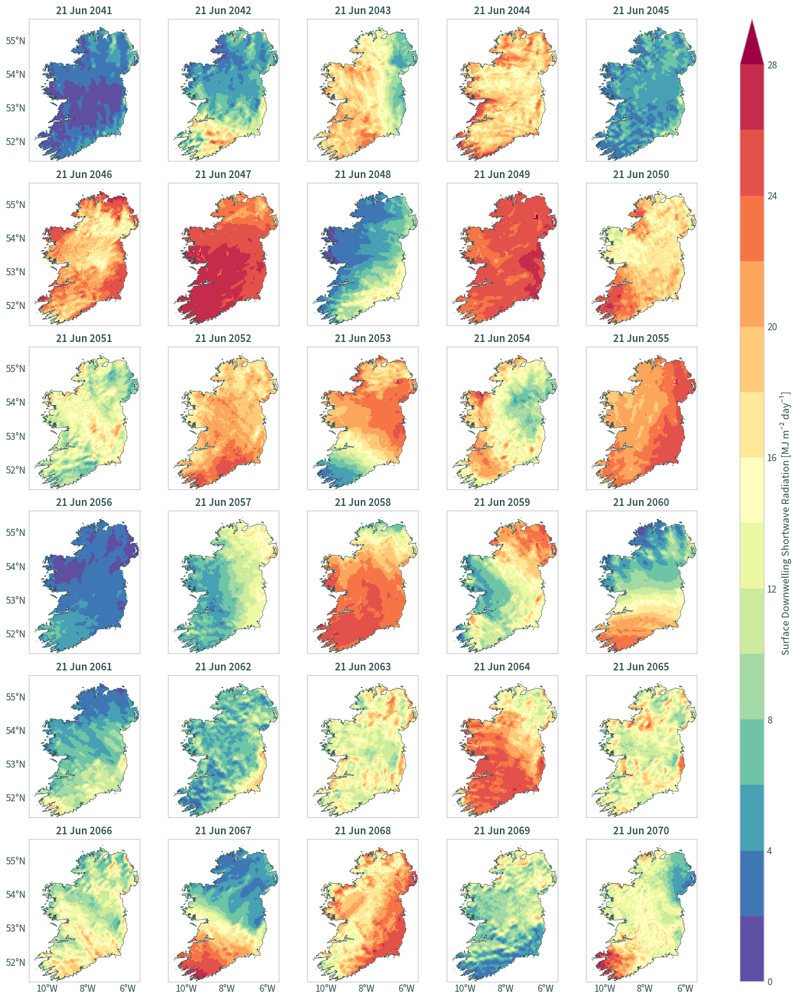

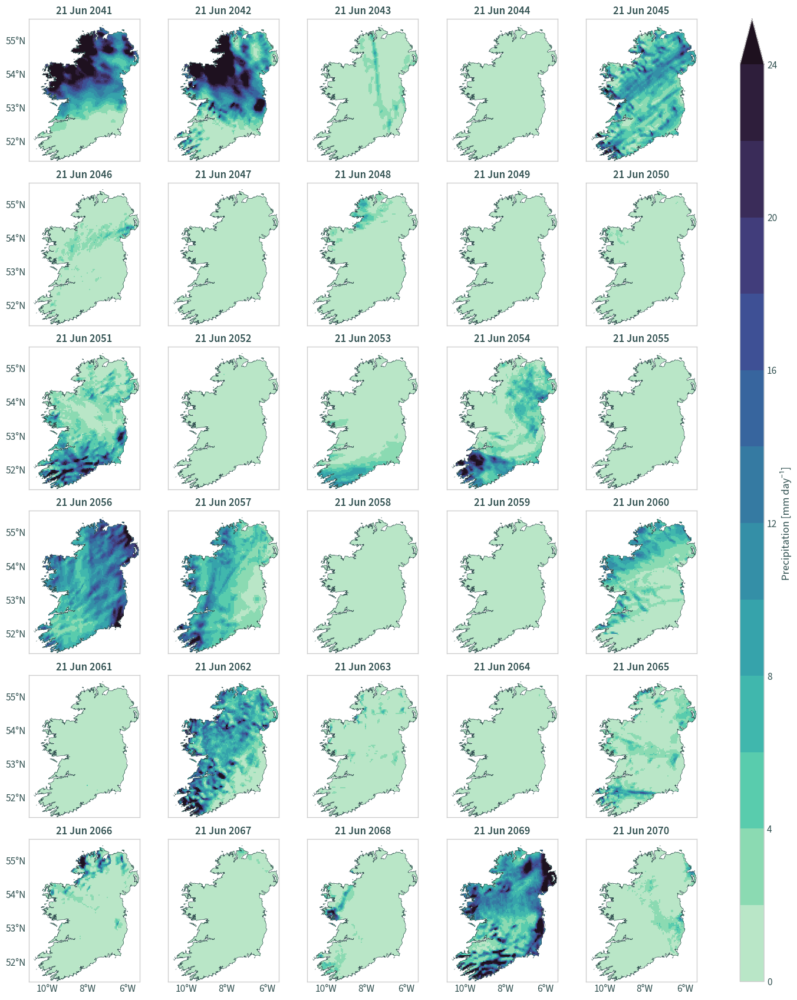

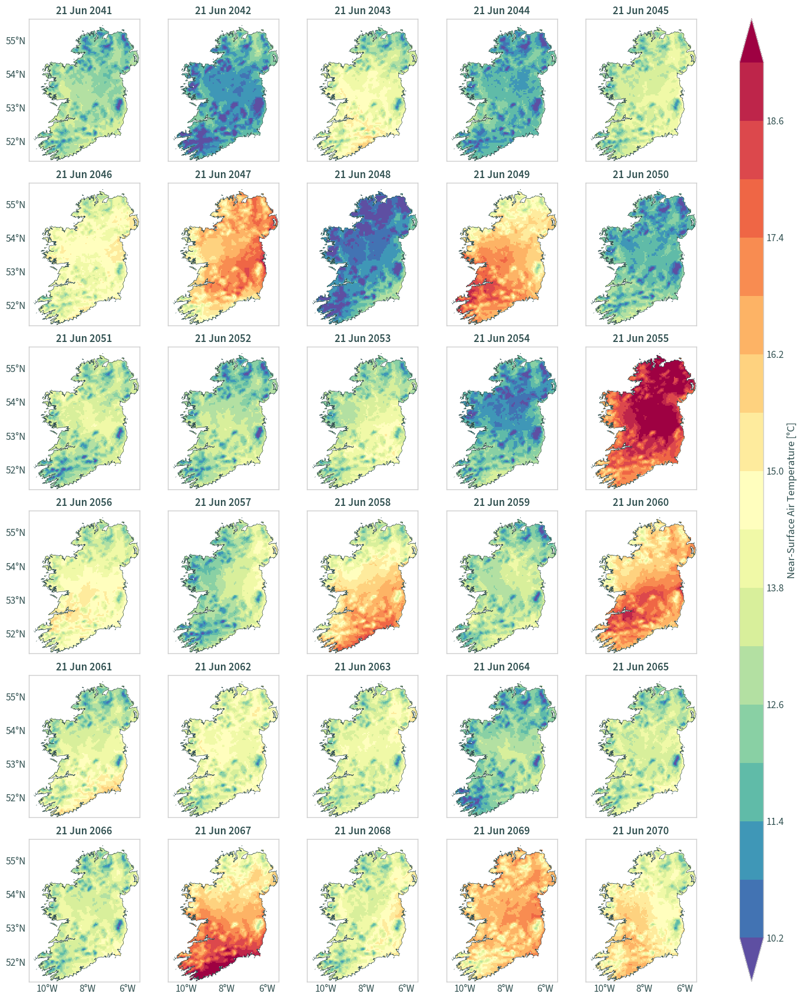

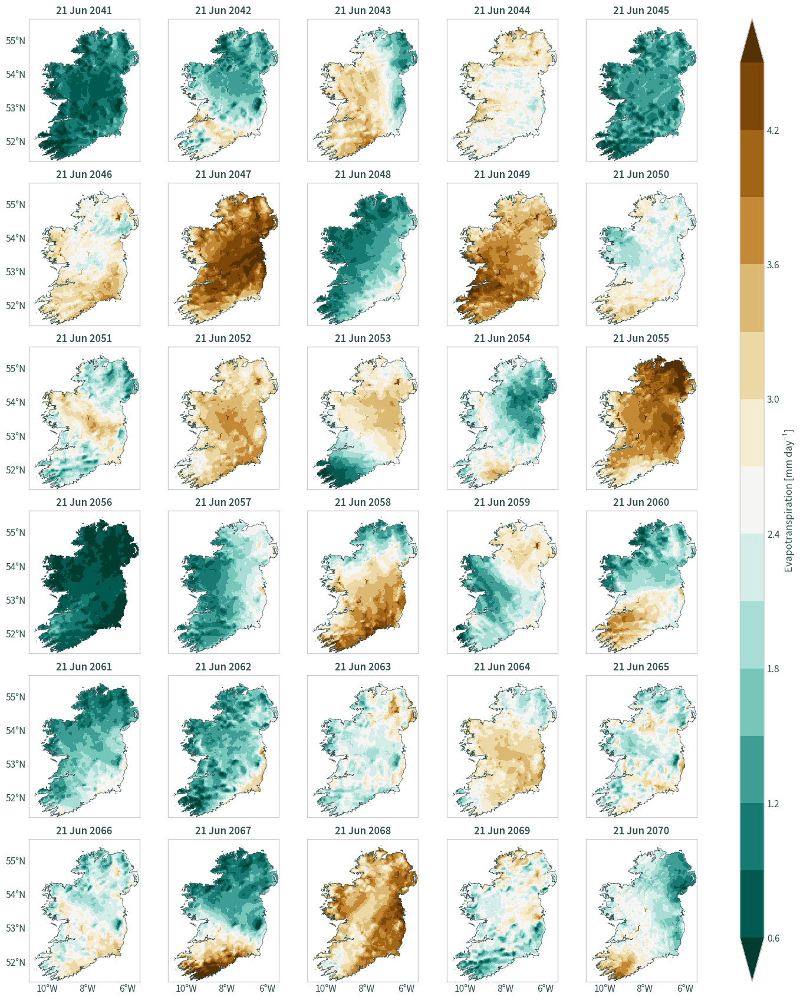

In [19]:
cplt.plot_facet_map_variables(data_ie, ie)

In [20]:
data_ie = data.sel(time="2055-06-21T10:30:00.000000000")

In [21]:
data_ie

<xarray.Dataset>
Dimensions:       (rlat: 113, rlon: 85, bnds: 2)
Coordinates:
    time          datetime64[ns] 2055-06-21T10:30:00
    lon           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
    lat           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
  * rlon          (rlon) float64 -1.54 -1.505 -1.47 -1.435 ... 1.33 1.365 1.4
  * rlat          (rlat) float64 -1.945 -1.91 -1.875 -1.84 ... 1.905 1.94 1.975
    height_2m     float32 2.0
    spatial_ref   int64 0
    rotated_pole  int32 1
    time_bnds     (bnds) datetime64[ns] dask.array<chunksize=(2,), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    rsds          (rlat, rlon) float32 dask.array<chunksize=(70, 49), meta=np.ndarray>
    pr            (rlat, rlon) float32 dask.array<chunksize=(70, 49), meta=np.ndarray>
    tas           (rlat, rlon) float32 dask.array<chunksize=(70, 49), meta=np.ndarray>
    evspsblpot    (rlat, rlon) float32 dask.array<chunksize=(70, 49), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.9.5 (http://mpimet.mpg....
    history:         Sun Oct 02 21:51:46 2022: cdo -s -L -f nc4c -z zip_9 sel...
    Conventions:     CF-1.4
    title:           COSMO5_MPI-ESM-LR_rcp85_4km
    experiment_id:   COSMO5_MPI-ESM-LR_rcp85_4km
    realization:     1
    conventionsURL:  http://www.cfconventions.org/
    contact:         Paul Nolan
    references:      http://www.ichec.ie
    creation_date:   2018-05-03 18:27:15
    frequency:       day
    CDO:             Climate Data Operators version 1.9.5 (http://mpimet.mpg....

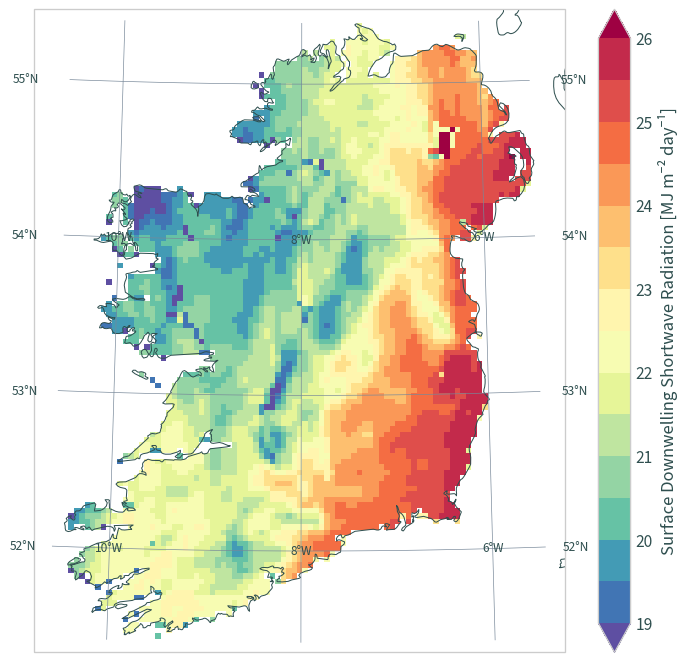

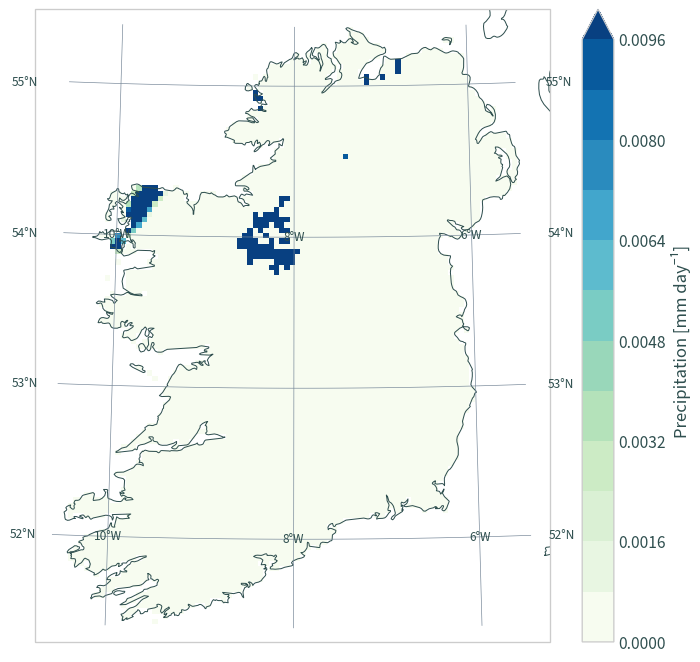

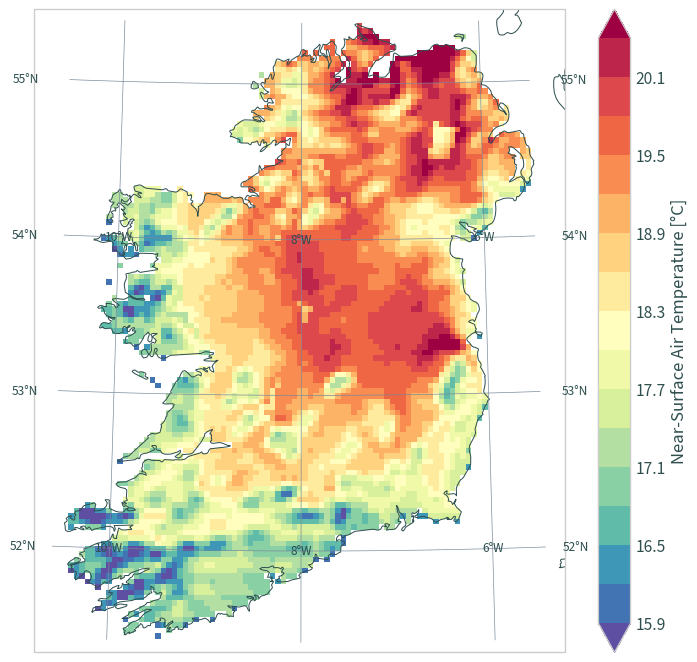

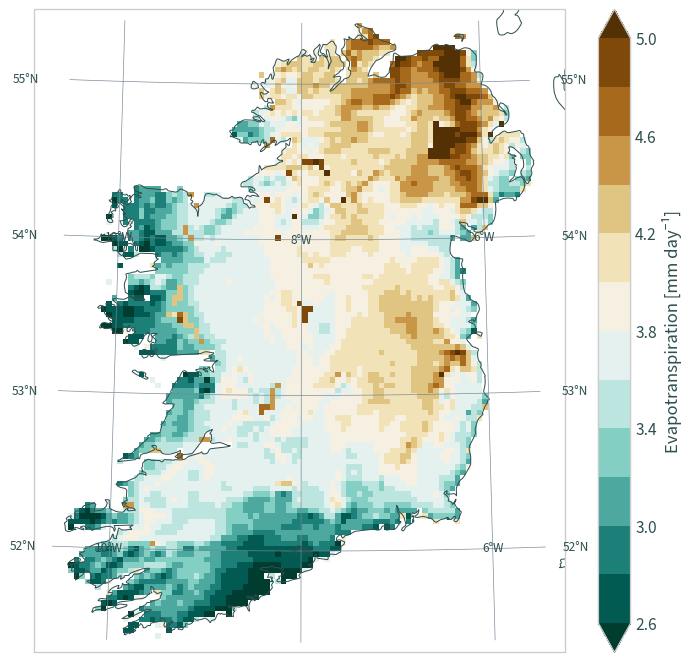

In [22]:
cplt.plot_map_variables(data_ie)

### Point subset

In [23]:
cds = cplt.rotated_pole_point(data=data, lon=LON, lat=LAT)

In [24]:
data_ie = data.sel({"rlon": cds[0], "rlat": cds[1]}, method="nearest")

In [25]:
data_ie

<xarray.Dataset>
Dimensions:       (time: 10957, bnds: 2)
Coordinates:
  * time          (time) datetime64[ns] 2041-01-01T10:30:00 ... 2070-12-31T10...
    lon           float32 dask.array<chunksize=(), meta=np.ndarray>
    lat           float32 dask.array<chunksize=(), meta=np.ndarray>
    rlon          float64 -0.35
    rlat          float64 -1.56
    height_2m     float32 2.0
    spatial_ref   int64 0
    rotated_pole  int32 1
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(10957, 2), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    rsds          (time) float32 dask.array<chunksize=(6314,), meta=np.ndarray>
    pr            (time) float32 dask.array<chunksize=(6314,), meta=np.ndarray>
    tas           (time) float32 dask.array<chunksize=(6314,), meta=np.ndarray>
    evspsblpot    (time) float32 dask.array<chunksize=(6314,), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.9.5 (http://mpimet.mpg....
    history:         Sun Oct 02 21:51:46 2022: cdo -s -L -f nc4c -z zip_9 sel...
    Conventions:     CF-1.4
    title:           COSMO5_MPI-ESM-LR_rcp85_4km
    experiment_id:   COSMO5_MPI-ESM-LR_rcp85_4km
    realization:     1
    conventionsURL:  http://www.cfconventions.org/
    contact:         Paul Nolan
    references:      http://www.ichec.ie
    creation_date:   2018-05-03 18:27:15
    frequency:       day
    CDO:             Climate Data Operators version 1.9.5 (http://mpimet.mpg....

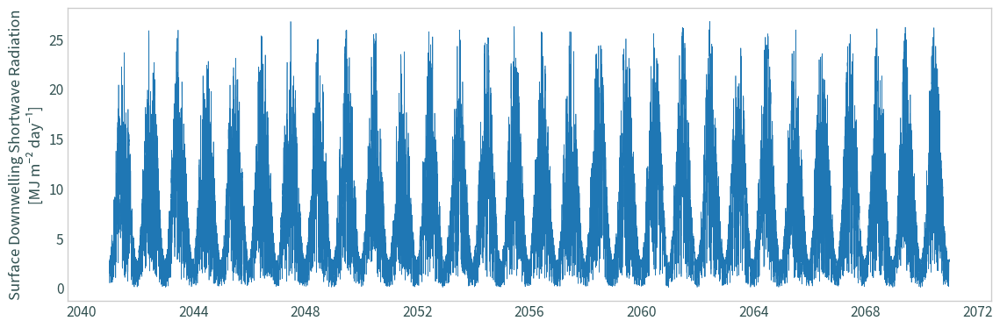

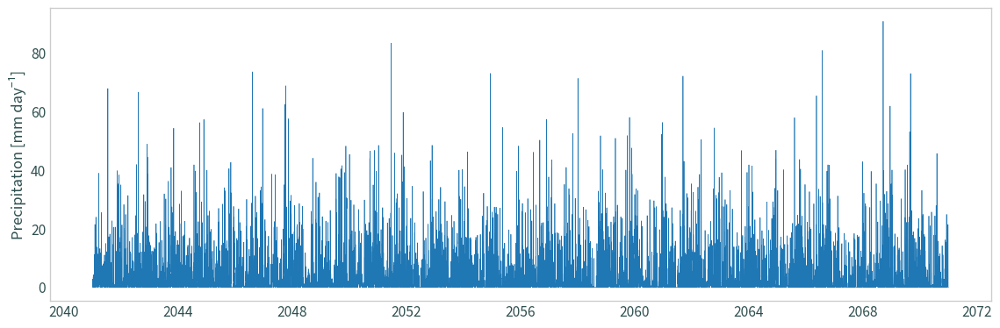

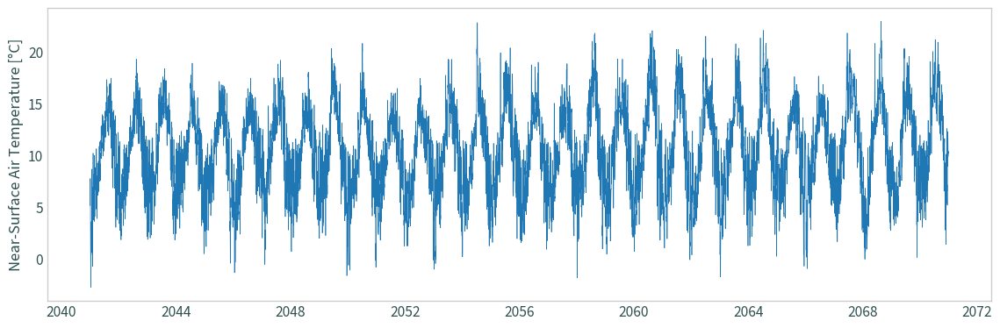

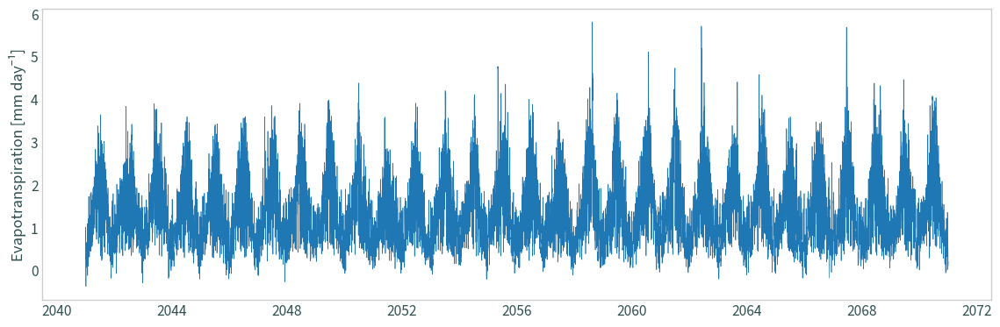

In [26]:
for v in data_ie.data_vars:
    plt.figure(figsize=(12, 4))
    plt.plot(data_ie["time"], data_ie[v], linewidth=.5)
    # plt.xlabel(data_ie["time"].attrs["standard_name"].capitalize())
    # plt.title(cplt.cordex_plot_title(data_ie, lon=LON, lat=LAT))
    if v == "rsds":
        ylabel = (
            f"{data_ie[v].attrs['long_name']}\n[{data_ie[v].attrs['units']}]"
        )
    else:
        ylabel = (
            f"{data_ie[v].attrs['long_name']} [{data_ie[v].attrs['units']}]"
        )
    plt.ylabel(ylabel)
    plt.tight_layout()
    plt.show()

### Export data

In [29]:
# assign attributes for the data
data.attrs["comment"] = (
    "This dataset has been clipped with the Island of Ireland's boundary. "
    "Last updated: " + str(datetime.now(tz=timezone.utc)) +
    " by nstreethran@ucc.ie."
)

In [30]:
# reassign CRS
data.rio.write_crs(data_crs, inplace=True)

<xarray.Dataset>
Dimensions:       (time: 10957, rlat: 113, rlon: 85, bnds: 2)
Coordinates:
  * time          (time) datetime64[ns] 2041-01-01T10:30:00 ... 2070-12-31T10...
    lon           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
    lat           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
  * rlon          (rlon) float64 -1.54 -1.505 -1.47 -1.435 ... 1.33 1.365 1.4
  * rlat          (rlat) float64 -1.945 -1.91 -1.875 -1.84 ... 1.905 1.94 1.975
    height_2m     float32 2.0
    spatial_ref   int64 0
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(10957, 2), meta=np.ndarray>
    rotated_pole  int64 0
Dimensions without coordinates: bnds
Data variables:
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
Attributes: (12/13)
    CDI:             Climate Data Interface version 1.9.5 (http://mpimet.mpg....
    history:         Sun Oct 02 21:51:46 2022: cdo -s -L -f nc4c -z zip_9 sel...
    Conventions:     CF-1.4
    title:           COSMO5_MPI-ESM-LR_rcp85_4km
    experiment_id:   COSMO5_MPI-ESM-LR_rcp85_4km
    realization:     1
    ...              ...
    contact:         Paul Nolan
    references:      http://www.ichec.ie
    creation_date:   2018-05-03 18:27:15
    frequency:       day
    CDO:             Climate Data Operators version 1.9.5 (http://mpimet.mpg....
    comment:         This dataset has been clipped with the Island of Ireland...

In [31]:
data.rio.crs

CRS.from_wkt('GEOGCRS["undefined",BASEGEOGCRS["undefined",DATUM["World Geodetic System 1984",ELLIPSOID["WGS 84",6378137,298.257223563,LENGTHUNIT["metre",1]],ID["EPSG",6326]],PRIMEM["Greenwich",0,ANGLEUNIT["degree",0.0174532925199433],ID["EPSG",8901]]],DERIVINGCONVERSION["Pole rotation (netCDF CF convention)",METHOD["Pole rotation (netCDF CF convention)"],PARAMETER["Grid north pole latitude (netCDF CF convention)",36.5999984741211,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["Grid north pole longitude (netCDF CF convention)",172.100006103516,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["North pole grid longitude (netCDF CF convention)",0,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]],CS[ellipsoidal,2],AXIS["longitude",east,ORDER[1],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],AXIS["latitude",north,ORDER[2],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]]')

In [32]:
data.to_netcdf(os.path.join(
    DATA_DIR_BASE,
    "rcp85",
    "_".join(sorted(list(data.data_vars))) + "_" + data.attrs["title"] + ".nc"
))

## historical

In [27]:
data = xr.open_mfdataset(
    list(itertools.chain(*list(
        glob.glob(os.path.join(DATA_DIR_BASE, "historical", "MPI-ESM-LR", e))
        for e in ["*mean_T_2M*.nc", "*ASOB_S*.nc", "*ET*.nc", "*TOT_PREC*.nc"]
    ))),
    chunks="auto",
    decode_coords="all"
)

In [28]:
data

<xarray.Dataset>
Dimensions:       (time: 10958, bnds: 2, rlat: 145, rlon: 112)
Coordinates:
  * time          (time) datetime64[ns] 1976-01-01T10:30:00 ... 2005-12-31T10...
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(10958, 2), meta=np.ndarray>
    lon           (rlat, rlon) float32 dask.array<chunksize=(145, 112), meta=np.ndarray>
    lat           (rlat, rlon) float32 dask.array<chunksize=(145, 112), meta=np.ndarray>
  * rlon          (rlon) float64 -2.065 -2.03 -1.995 -1.96 ... 1.75 1.785 1.82
  * rlat          (rlat) float64 -2.4 -2.365 -2.33 -2.295 ... 2.57 2.605 2.64
    rotated_pole  int32 1
    height_2m     float32 2.0
Dimensions without coordinates: bnds
Data variables:
    ASOB_S        (time, rlat, rlon) float32 dask.array<chunksize=(6314, 83, 64), meta=np.ndarray>
    TOT_PREC      (time, rlat, rlon) float32 dask.array<chunksize=(6314, 83, 64), meta=np.ndarray>
    T_2M          (time, rlat, rlon) float32 dask.array<chunksize=(6314, 83, 64), meta=np.ndarray>
    w             (time, rlat, rlon) float32 dask.array<chunksize=(6314, 83, 64), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.9.8 (https://mpimet.mpg...
    Conventions:     CF-1.4
    history:         Mon May 23 21:03:42 2022: cdo -s -L -f nc4c -z zip_9 -da...
    title:           COSMO5_MPI-ESM-LR_historical_4km
    experiment_id:   COSMO5_MPI-ESM-LR_historical_4km
    realization:     1
    conventionsURL:  http://www.cfconventions.org/
    contact:         Paul Nolan
    references:      http://www.ichec.ie
    creation_date:   2017-07-23 22:41:53
    frequency:       day
    CDO:             Climate Data Operators version 1.9.8 (https://mpimet.mpg...

In [29]:
# copy time_bnds
data_time_bnds = data.coords["time_bnds"]

In [30]:
# copy CRS
data_crs = data.rio.crs

In [31]:
data_crs

CRS.from_wkt('GEOGCRS["undefined",BASEGEOGCRS["undefined",DATUM["World Geodetic System 1984",ELLIPSOID["WGS 84",6378137,298.257223563,LENGTHUNIT["metre",1]],ID["EPSG",6326]],PRIMEM["Greenwich",0,ANGLEUNIT["degree",0.0174532925199433],ID["EPSG",8901]]],DERIVINGCONVERSION["Pole rotation (netCDF CF convention)",METHOD["Pole rotation (netCDF CF convention)"],PARAMETER["Grid north pole latitude (netCDF CF convention)",36.5999984741211,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["Grid north pole longitude (netCDF CF convention)",172.100006103516,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["North pole grid longitude (netCDF CF convention)",0,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]],CS[ellipsoidal,2],AXIS["longitude",east,ORDER[1],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],AXIS["latitude",north,ORDER[2],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]]')

### Ireland subset

In [32]:
# clip to Ireland's boundary
data = data.rio.clip(ie.buffer(1).to_crs(data.rio.crs))

In [33]:
# reassign time_bnds
data.coords["time_bnds"] = data_time_bnds

In [34]:
data

<xarray.Dataset>
Dimensions:       (time: 10958, rlat: 113, rlon: 85, bnds: 2)
Coordinates:
  * time          (time) datetime64[ns] 1976-01-01T10:30:00 ... 2005-12-31T10...
    lon           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
    lat           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
  * rlon          (rlon) float64 -1.54 -1.505 -1.47 -1.435 ... 1.33 1.365 1.4
  * rlat          (rlat) float64 -1.945 -1.91 -1.875 -1.84 ... 1.905 1.94 1.975
    height_2m     float32 2.0
    spatial_ref   int64 0
    rotated_pole  int32 1
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(10958, 2), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    ASOB_S        (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    TOT_PREC      (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    T_2M          (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    w             (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.9.8 (https://mpimet.mpg...
    Conventions:     CF-1.4
    history:         Mon May 23 21:03:42 2022: cdo -s -L -f nc4c -z zip_9 -da...
    title:           COSMO5_MPI-ESM-LR_historical_4km
    experiment_id:   COSMO5_MPI-ESM-LR_historical_4km
    realization:     1
    conventionsURL:  http://www.cfconventions.org/
    contact:         Paul Nolan
    references:      http://www.ichec.ie
    creation_date:   2017-07-23 22:41:53
    frequency:       day
    CDO:             Climate Data Operators version 1.9.8 (https://mpimet.mpg...

### Convert units and rename variables

In [35]:
for v in data.data_vars:
    var_attrs = data[v].attrs  # extract attributes
    if v == "T_2M":
        var_attrs["units"] = "°C"  # convert K to deg C
        data[v] = data[v] - 273.15
        var_attrs["long_name"] = "Near-Surface Air Temperature"
    elif v == "ASOB_S":
        var_attrs["units"] = "MJ m⁻² day⁻¹"  # convert W m-2 to MJ m-2 day-1
        # Allen (1998) - FAO Irrigation and Drainage Paper No. 56 (p. 45)
        # (per second to per day; then convert to mega)
        data[v] = data[v] * (60 * 60 * 24 / 1e6)
        var_attrs["long_name"] = "Surface Downwelling Shortwave Radiation"
    elif v == "TOT_PREC":
        var_attrs["units"] = "mm day⁻¹"  # kg m-2 is the same as mm day-1
        var_attrs["long_name"] = "Precipitation"
    else:
        var_attrs["units"] = "mm day⁻¹"
        var_attrs["long_name"] = "Evapotranspiration"
        var_attrs["standard_name"] = "evapotranspiration"
    data[v].attrs = var_attrs  # reassign attributes

In [36]:
# rename
data = data.rename({
    "T_2M": "tas", "ASOB_S": "rsds", "TOT_PREC": "pr", "w": "evspsblpot"
})

In [37]:
data

<xarray.Dataset>
Dimensions:       (time: 10958, rlat: 113, rlon: 85, bnds: 2)
Coordinates:
  * time          (time) datetime64[ns] 1976-01-01T10:30:00 ... 2005-12-31T10...
    lon           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
    lat           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
  * rlon          (rlon) float64 -1.54 -1.505 -1.47 -1.435 ... 1.33 1.365 1.4
  * rlat          (rlat) float64 -1.945 -1.91 -1.875 -1.84 ... 1.905 1.94 1.975
    height_2m     float32 2.0
    spatial_ref   int64 0
    rotated_pole  int32 1
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(10958, 2), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.9.8 (https://mpimet.mpg...
    Conventions:     CF-1.4
    history:         Mon May 23 21:03:42 2022: cdo -s -L -f nc4c -z zip_9 -da...
    title:           COSMO5_MPI-ESM-LR_historical_4km
    experiment_id:   COSMO5_MPI-ESM-LR_historical_4km
    realization:     1
    conventionsURL:  http://www.cfconventions.org/
    contact:         Paul Nolan
    references:      http://www.ichec.ie
    creation_date:   2017-07-23 22:41:53
    frequency:       day
    CDO:             Climate Data Operators version 1.9.8 (https://mpimet.mpg...

### Time subset

In [38]:
data_ie = data.sel(
    time=[
        str(year) + "-06-21T10:30:00.000000000" for year in sorted(
            list(set(data["time"].dt.year.values))
        )
    ]
)

In [39]:
data_ie

<xarray.Dataset>
Dimensions:       (time: 30, rlat: 113, rlon: 85, bnds: 2)
Coordinates:
  * time          (time) datetime64[ns] 1976-06-21T10:30:00 ... 2005-06-21T10...
    lon           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
    lat           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
  * rlon          (rlon) float64 -1.54 -1.505 -1.47 -1.435 ... 1.33 1.365 1.4
  * rlat          (rlat) float64 -1.945 -1.91 -1.875 -1.84 ... 1.905 1.94 1.975
    height_2m     float32 2.0
    spatial_ref   int64 0
    rotated_pole  int32 1
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(30, 2), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(17, 70, 49), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(17, 70, 49), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(17, 70, 49), meta=np.ndarray>
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(17, 70, 49), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.9.8 (https://mpimet.mpg...
    Conventions:     CF-1.4
    history:         Mon May 23 21:03:42 2022: cdo -s -L -f nc4c -z zip_9 -da...
    title:           COSMO5_MPI-ESM-LR_historical_4km
    experiment_id:   COSMO5_MPI-ESM-LR_historical_4km
    realization:     1
    conventionsURL:  http://www.cfconventions.org/
    contact:         Paul Nolan
    references:      http://www.ichec.ie
    creation_date:   2017-07-23 22:41:53
    frequency:       day
    CDO:             Climate Data Operators version 1.9.8 (https://mpimet.mpg...

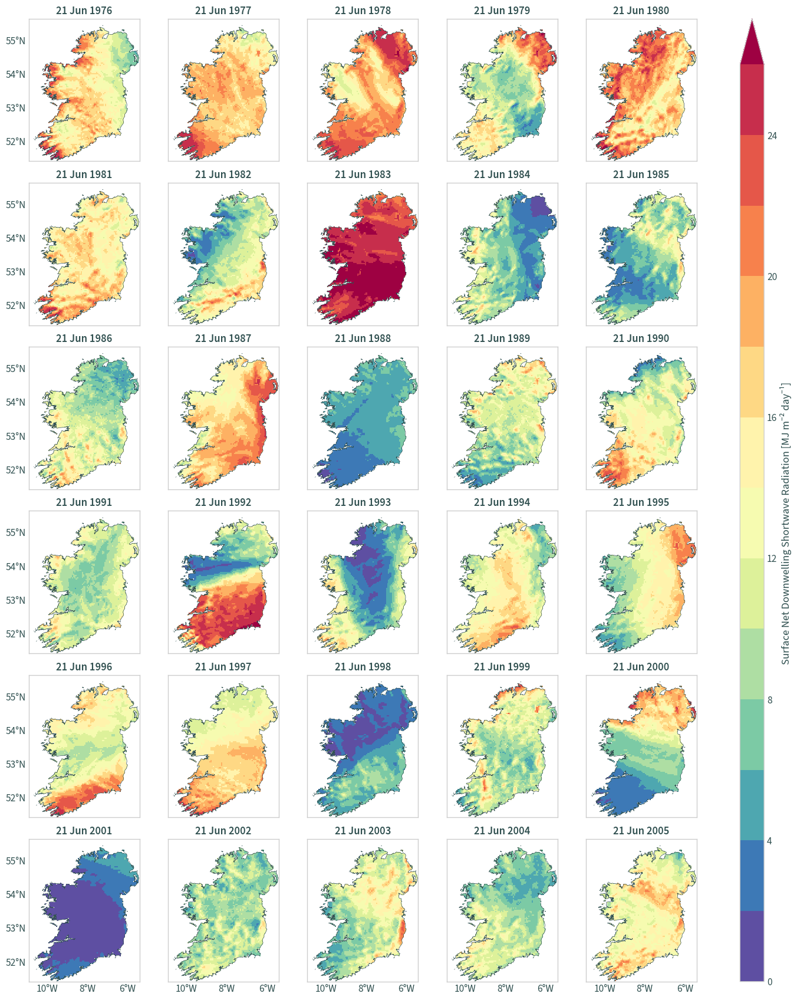

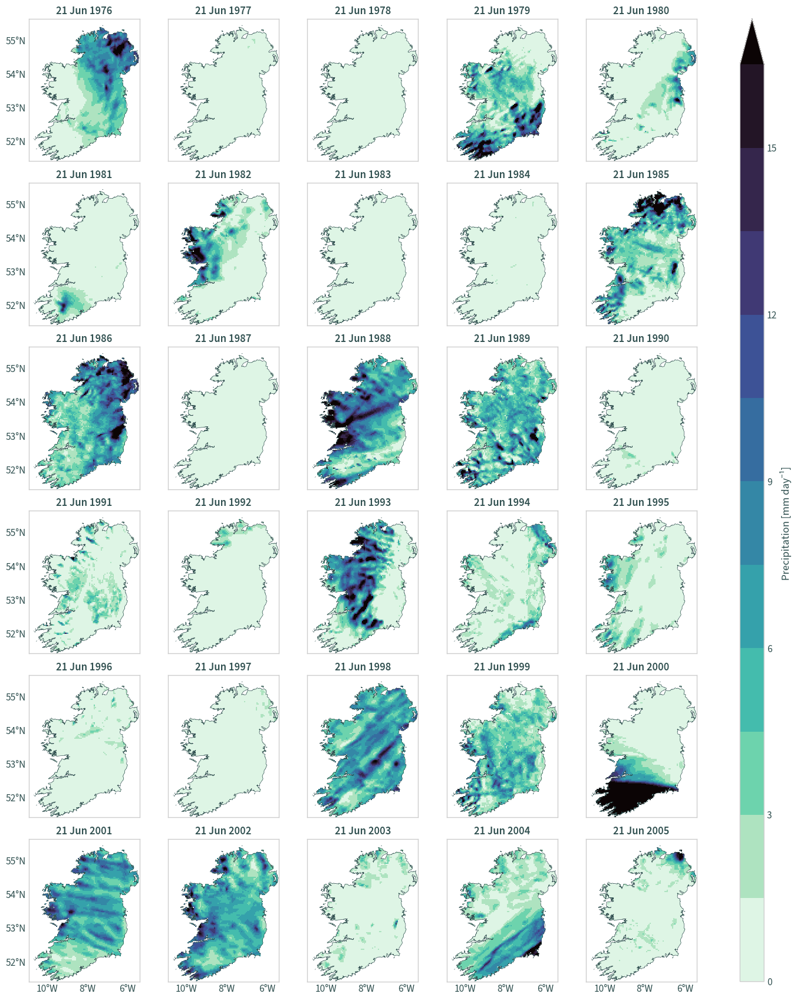

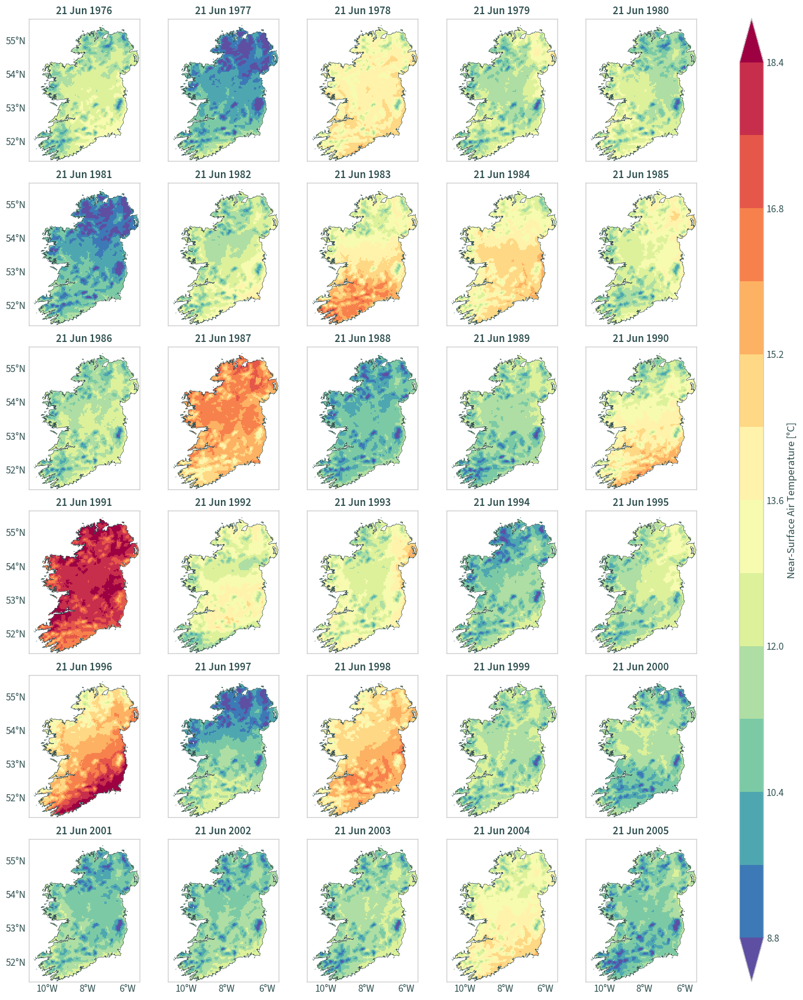

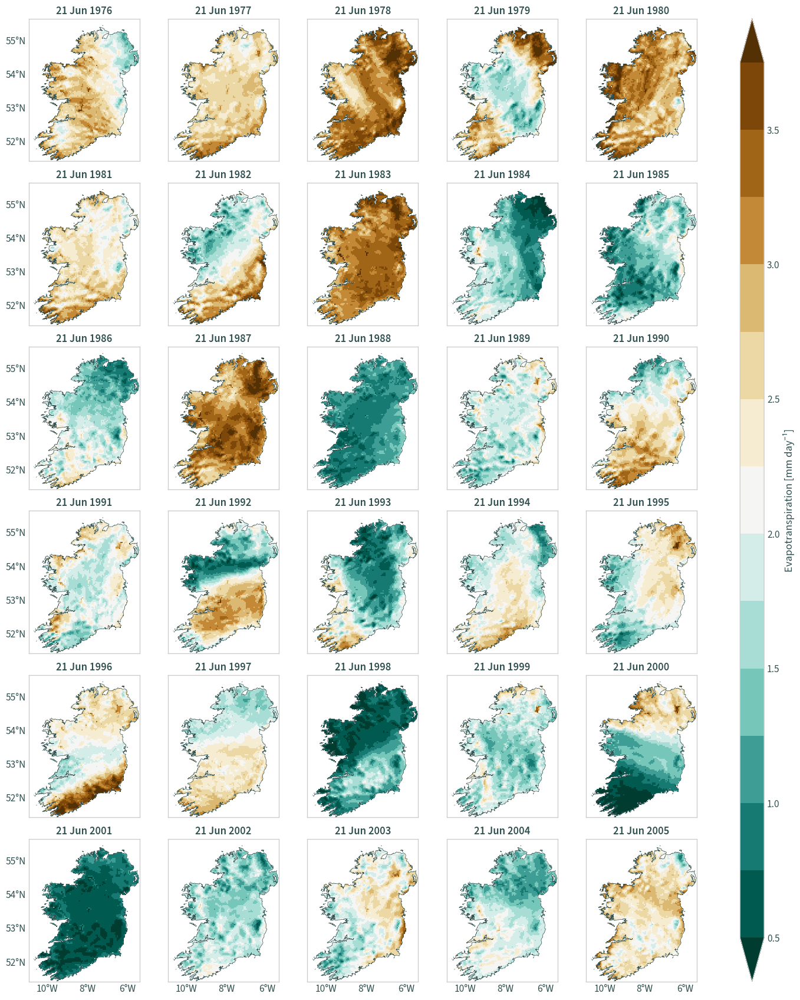

In [40]:
cplt.plot_facet_map_variables(data_ie, ie)

In [41]:
data_ie = data.sel(time="1990-06-21T10:30:00.000000000")

In [42]:
data_ie

<xarray.Dataset>
Dimensions:       (rlat: 113, rlon: 85, bnds: 2)
Coordinates:
    time          datetime64[ns] 1990-06-21T10:30:00
    lon           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
    lat           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
  * rlon          (rlon) float64 -1.54 -1.505 -1.47 -1.435 ... 1.33 1.365 1.4
  * rlat          (rlat) float64 -1.945 -1.91 -1.875 -1.84 ... 1.905 1.94 1.975
    height_2m     float32 2.0
    spatial_ref   int64 0
    rotated_pole  int32 1
    time_bnds     (bnds) datetime64[ns] dask.array<chunksize=(2,), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    rsds          (rlat, rlon) float32 dask.array<chunksize=(70, 49), meta=np.ndarray>
    pr            (rlat, rlon) float32 dask.array<chunksize=(70, 49), meta=np.ndarray>
    tas           (rlat, rlon) float32 dask.array<chunksize=(70, 49), meta=np.ndarray>
    evspsblpot    (rlat, rlon) float32 dask.array<chunksize=(70, 49), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.9.8 (https://mpimet.mpg...
    Conventions:     CF-1.4
    history:         Mon May 23 21:03:42 2022: cdo -s -L -f nc4c -z zip_9 -da...
    title:           COSMO5_MPI-ESM-LR_historical_4km
    experiment_id:   COSMO5_MPI-ESM-LR_historical_4km
    realization:     1
    conventionsURL:  http://www.cfconventions.org/
    contact:         Paul Nolan
    references:      http://www.ichec.ie
    creation_date:   2017-07-23 22:41:53
    frequency:       day
    CDO:             Climate Data Operators version 1.9.8 (https://mpimet.mpg...

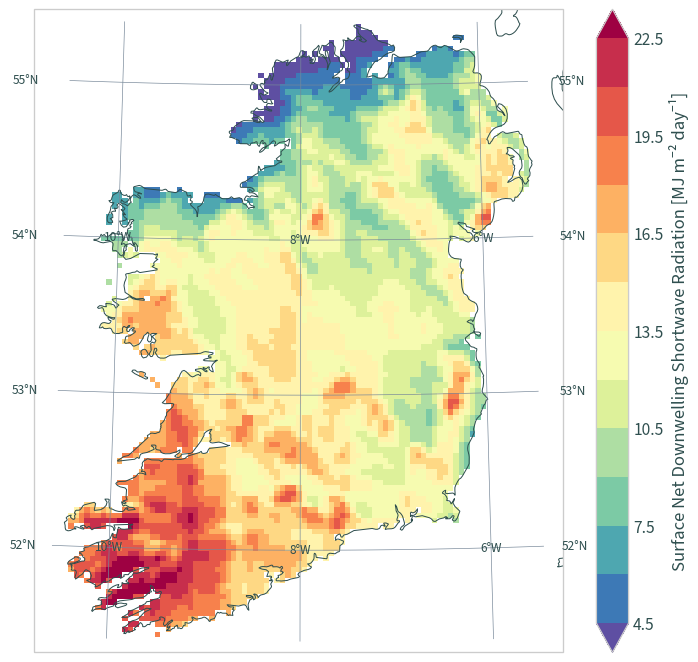

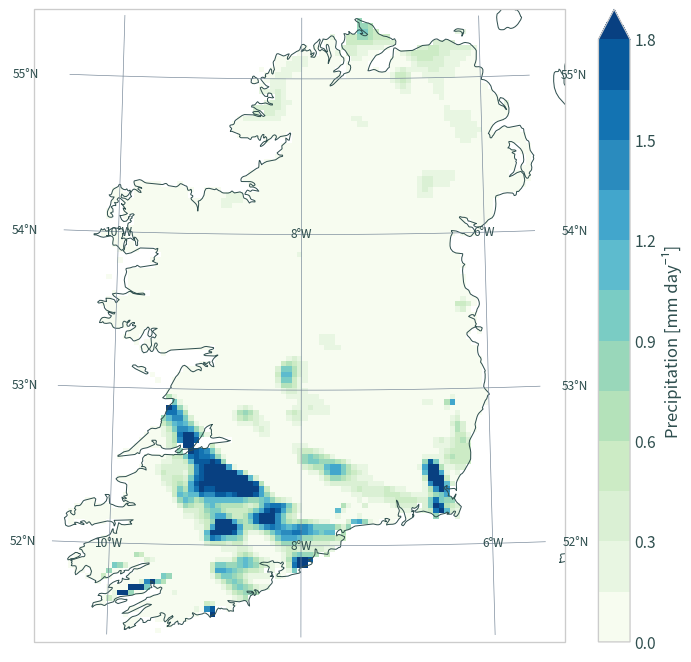

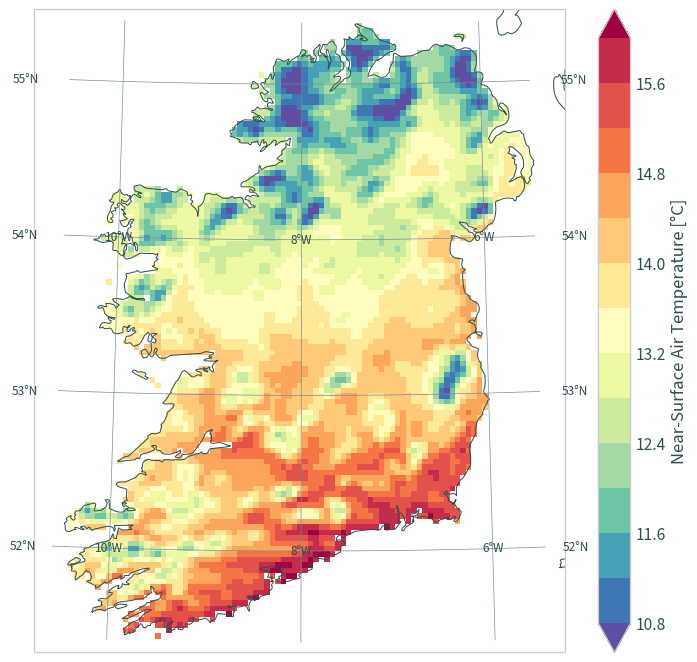

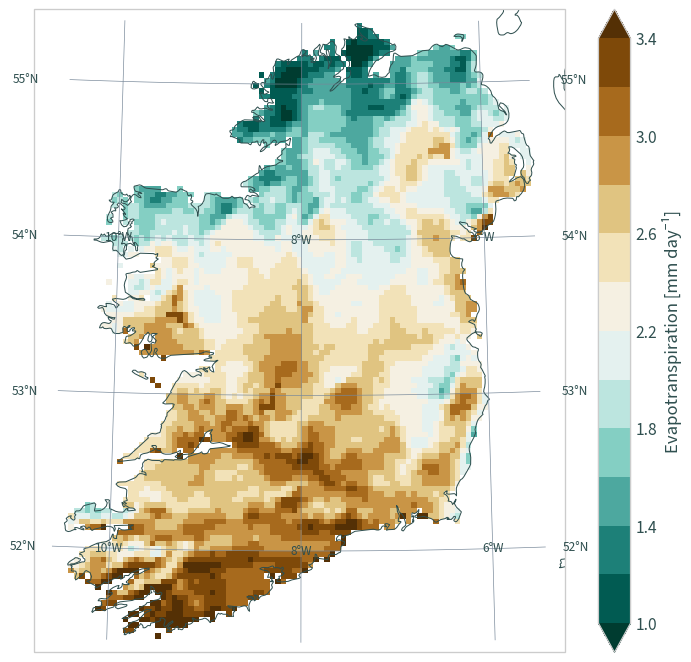

In [43]:
cplt.plot_map_variables(data_ie)

### Point subset

In [44]:
cds = cplt.rotated_pole_point(data=data, lon=LON, lat=LAT)

In [45]:
data_ie = data.sel({"rlon": cds[0], "rlat": cds[1]}, method="nearest")

In [46]:
data_ie

<xarray.Dataset>
Dimensions:       (time: 10958, bnds: 2)
Coordinates:
  * time          (time) datetime64[ns] 1976-01-01T10:30:00 ... 2005-12-31T10...
    lon           float32 dask.array<chunksize=(), meta=np.ndarray>
    lat           float32 dask.array<chunksize=(), meta=np.ndarray>
    rlon          float64 -0.35
    rlat          float64 -1.56
    height_2m     float32 2.0
    spatial_ref   int64 0
    rotated_pole  int32 1
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(10958, 2), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    rsds          (time) float32 dask.array<chunksize=(6314,), meta=np.ndarray>
    pr            (time) float32 dask.array<chunksize=(6314,), meta=np.ndarray>
    tas           (time) float32 dask.array<chunksize=(6314,), meta=np.ndarray>
    evspsblpot    (time) float32 dask.array<chunksize=(6314,), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.9.8 (https://mpimet.mpg...
    Conventions:     CF-1.4
    history:         Mon May 23 21:03:42 2022: cdo -s -L -f nc4c -z zip_9 -da...
    title:           COSMO5_MPI-ESM-LR_historical_4km
    experiment_id:   COSMO5_MPI-ESM-LR_historical_4km
    realization:     1
    conventionsURL:  http://www.cfconventions.org/
    contact:         Paul Nolan
    references:      http://www.ichec.ie
    creation_date:   2017-07-23 22:41:53
    frequency:       day
    CDO:             Climate Data Operators version 1.9.8 (https://mpimet.mpg...

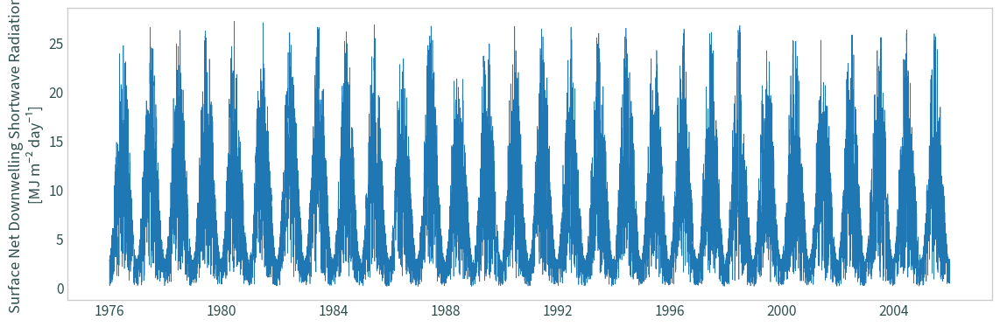

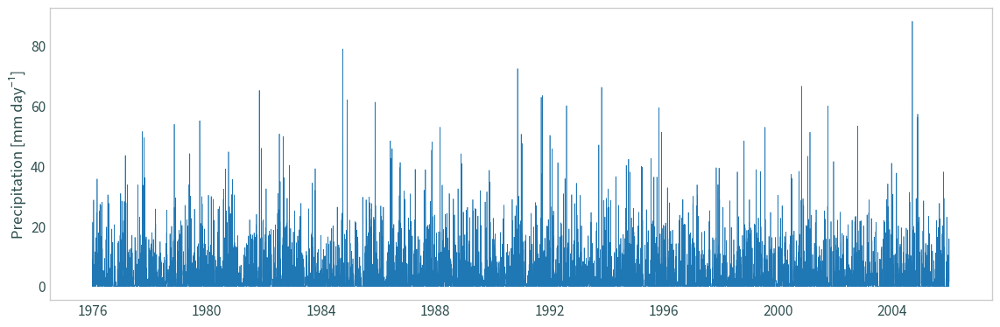

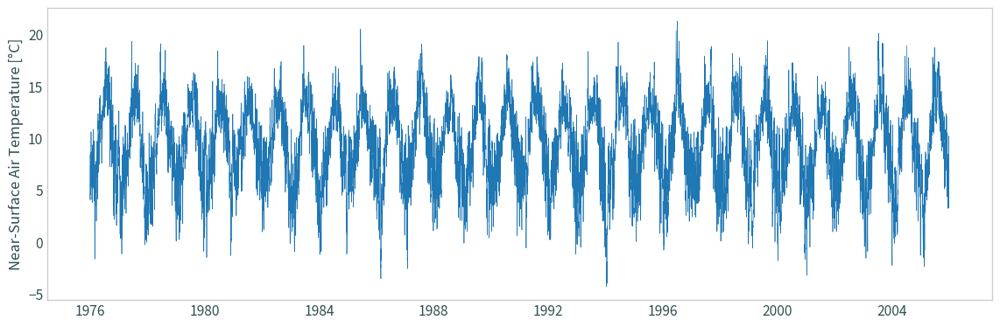

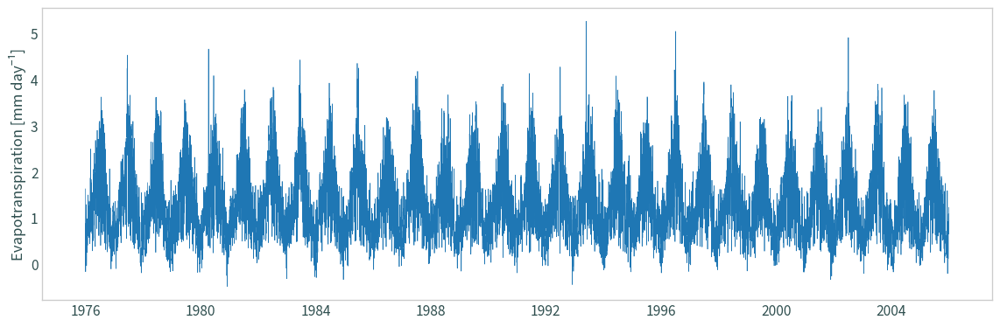

In [47]:
for v in data_ie.data_vars:
    plt.figure(figsize=(12, 4))
    plt.plot(data_ie["time"], data_ie[v], linewidth=.5)
    # plt.xlabel(data_ie["time"].attrs["standard_name"].capitalize())
    # plt.title(cplt.cordex_plot_title(data_ie, lon=LON, lat=LAT))
    if v == "rsds":
        ylabel = (
            f"{data_ie[v].attrs['long_name']}\n[{data_ie[v].attrs['units']}]"
        )
    else:
        ylabel = (
            f"{data_ie[v].attrs['long_name']} [{data_ie[v].attrs['units']}]"
        )
    plt.ylabel(ylabel)
    plt.tight_layout()
    plt.show()

### Export data

In [27]:
# assign attributes for the data
data.attrs["comment"] = (
    "This dataset has been clipped with the Island of Ireland's boundary. "
    "Last updated: " + str(datetime.now(tz=timezone.utc)) +
    " by nstreethran@ucc.ie."
)

In [29]:
# reassign CRS
data.rio.write_crs(data_crs, inplace=True)

<xarray.Dataset>
Dimensions:       (time: 10958, rlat: 113, rlon: 85)
Coordinates:
  * time          (time) datetime64[ns] 1976-01-01T10:30:00 ... 2005-12-31T10...
    lon           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
    lat           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
  * rlon          (rlon) float64 -1.54 -1.505 -1.47 -1.435 ... 1.33 1.365 1.4
  * rlat          (rlat) float64 -1.945 -1.91 -1.875 -1.84 ... 1.905 1.94 1.975
    height_2m     float32 2.0
    spatial_ref   int64 0
    rotated_pole  int64 0
Data variables:
    rsds          (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    pr            (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
    evspsblpot    (time, rlat, rlon) float32 dask.array<chunksize=(6314, 70, 49), meta=np.ndarray>
Attributes: (12/13)
    CDI:             Climate Data Interface version 1.9.8 (https://mpimet.mpg...
    Conventions:     CF-1.4
    history:         Mon May 23 21:03:42 2022: cdo -s -L -f nc4c -z zip_9 -da...
    title:           COSMO5_MPI-ESM-LR_historical_4km
    experiment_id:   COSMO5_MPI-ESM-LR_historical_4km
    realization:     1
    ...              ...
    contact:         Paul Nolan
    references:      http://www.ichec.ie
    creation_date:   2017-07-23 22:41:53
    frequency:       day
    CDO:             Climate Data Operators version 1.9.8 (https://mpimet.mpg...
    comment:         This dataset has been clipped with the Island of Ireland...

In [30]:
data.rio.crs

CRS.from_wkt('GEOGCRS["undefined",BASEGEOGCRS["undefined",DATUM["World Geodetic System 1984",ELLIPSOID["WGS 84",6378137,298.257223563,LENGTHUNIT["metre",1]],ID["EPSG",6326]],PRIMEM["Greenwich",0,ANGLEUNIT["degree",0.0174532925199433],ID["EPSG",8901]]],DERIVINGCONVERSION["Pole rotation (netCDF CF convention)",METHOD["Pole rotation (netCDF CF convention)"],PARAMETER["Grid north pole latitude (netCDF CF convention)",36.5999984741211,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["Grid north pole longitude (netCDF CF convention)",172.100006103516,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],PARAMETER["North pole grid longitude (netCDF CF convention)",0,ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]],CS[ellipsoidal,2],AXIS["longitude",east,ORDER[1],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]],AXIS["latitude",north,ORDER[2],ANGLEUNIT["degree",0.0174532925199433,ID["EPSG",9122]]]]')

In [31]:
data.to_netcdf(os.path.join(
    DATA_DIR_BASE,
    "historical",
    "_".join(sorted(list(data.data_vars))) + "_" + data.attrs["title"] + ".nc"
))